In [35]:
import openslide
import numpy as np
import mahotas as mh
import matplotlib
%matplotlib inline  

# pull in local code
import sys
sys.path.insert(0, '/Users/zgreyn/Documents/galvanize/projects/vegf/src')
import slideutils

## Define Helper Functions

In [29]:
def show(pix):
    fig, ax = plt.subplots(figsize=(6, 6))
    ax.imshow(pix, interpolation='nearest', aspect='equal')

In [20]:
def rgb2gray_invert(rgb):
    return 256 - np.dot(rgb[...,:3], [0.299, 0.587, 0.114]).astype('uint8')

In [26]:
def is_empty(img):
    pix = rgb2gray_invert(np.array(img)) # convert to gray scale and invert
    return np.sum(pix) < 60000  # 60K determined empirically 

## Load the Data

In [3]:
slides = []
slides.append(openslide.OpenSlide('data/70229.svs'))
slides.append(openslide.OpenSlide('data/70230.svs'))
slides.append(openslide.OpenSlide('data/70231.svs'))
slides.append(openslide.OpenSlide('data/70232.svs'))
slides.append(openslide.OpenSlide('data/70233.svs'))
slides.append(openslide.OpenSlide('data/70234.svs'))
slides.append(openslide.OpenSlide('data/70235.svs'))
slides.append(openslide.OpenSlide('data/70236.svs'))
slides.append(openslide.OpenSlide('data/70237.svs'))

slide_names = []
slide_names.append('70229')
slide_names.append('70230')
slide_names.append('70231')
slide_names.append('70232')
slide_names.append('70233')
slide_names.append('70234')
slide_names.append('70235')
slide_names.append('70236')
slide_names.append('70237')

50896 x 39591 : 2015.023536
51857 x 38210 : 1981.45597
10563 x 9849 : 104.034987
9603 x 10725 : 102.992175
14404 x 15008 : 216.175232
24968 x 20434 : 510.196112
12484 x 14376 : 179.469984
8642 x 12734 : 110.047228
13444 x 11490 : 154.47156


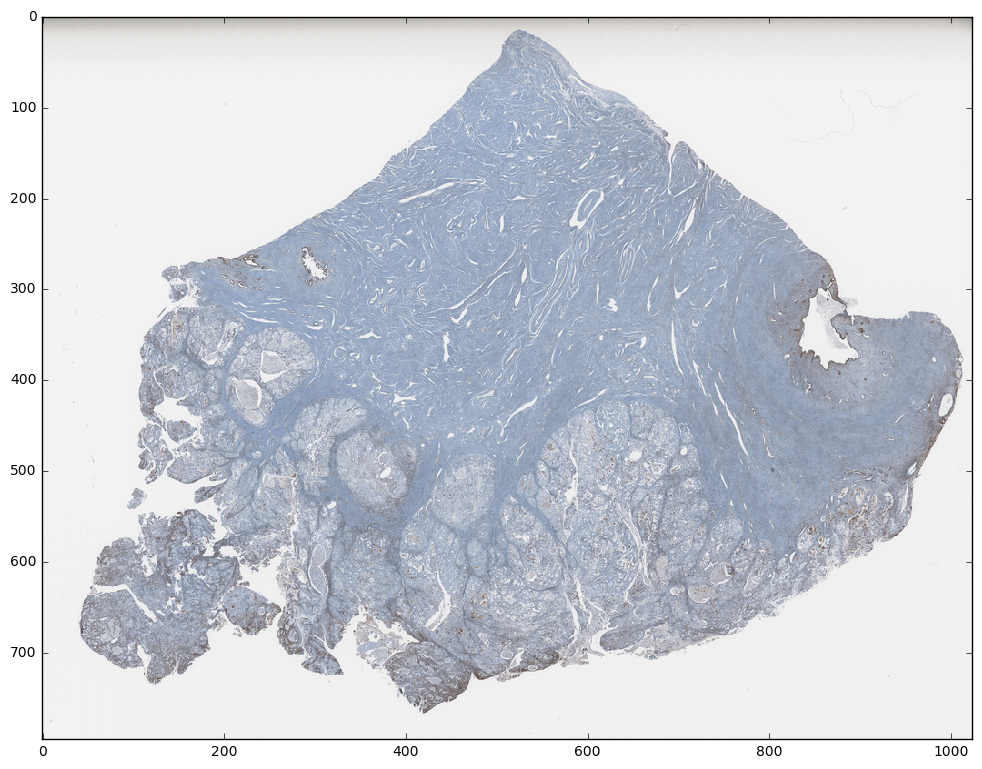

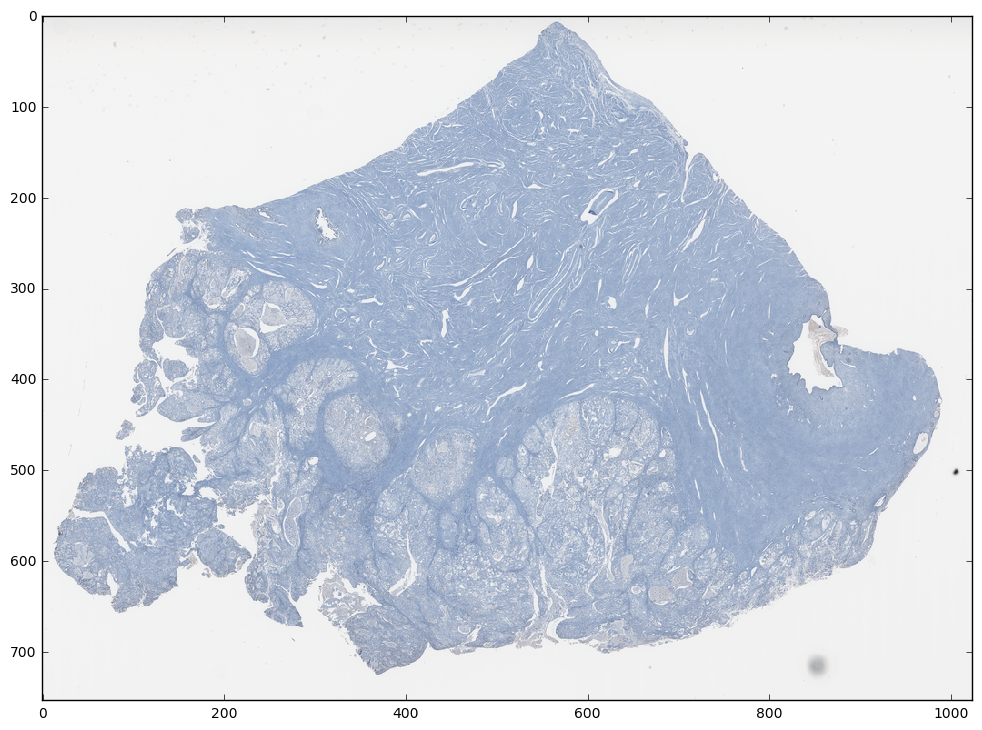

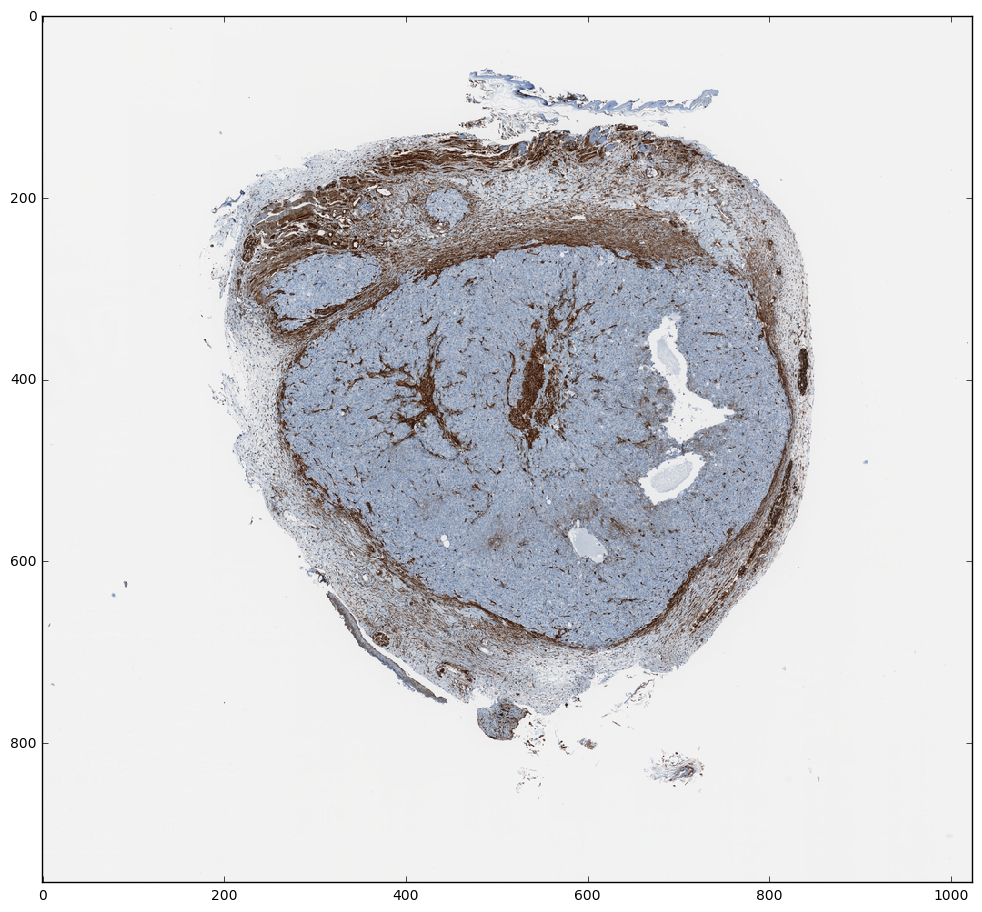

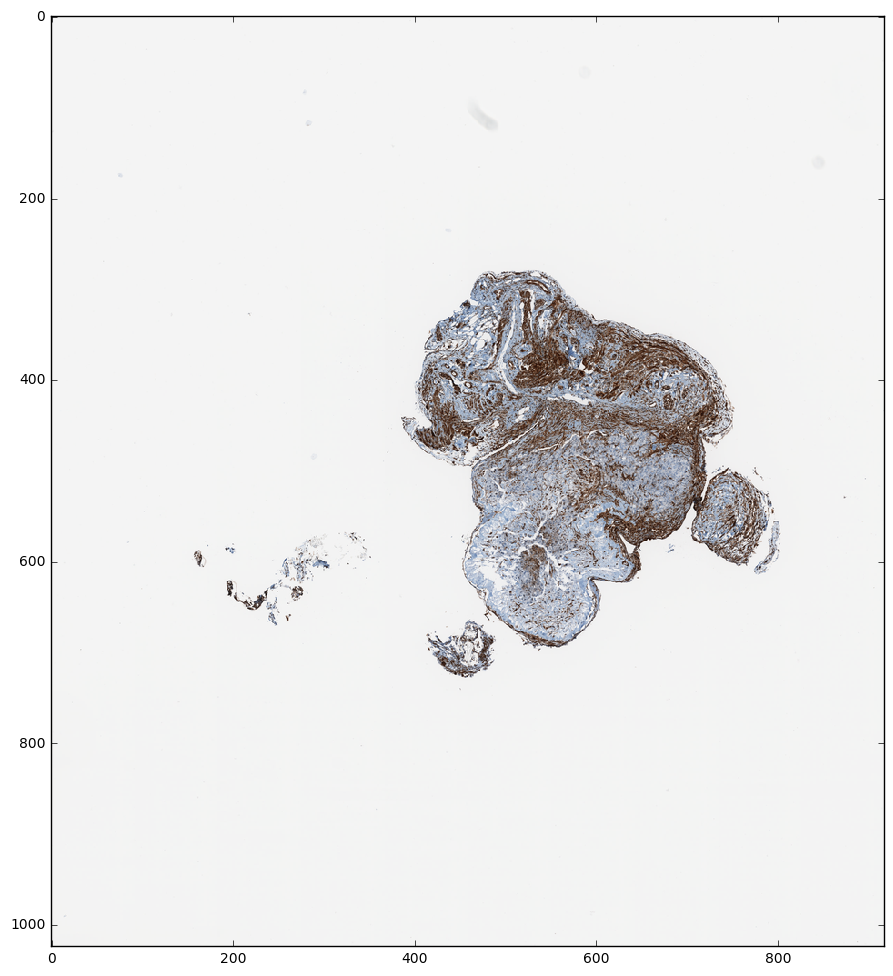

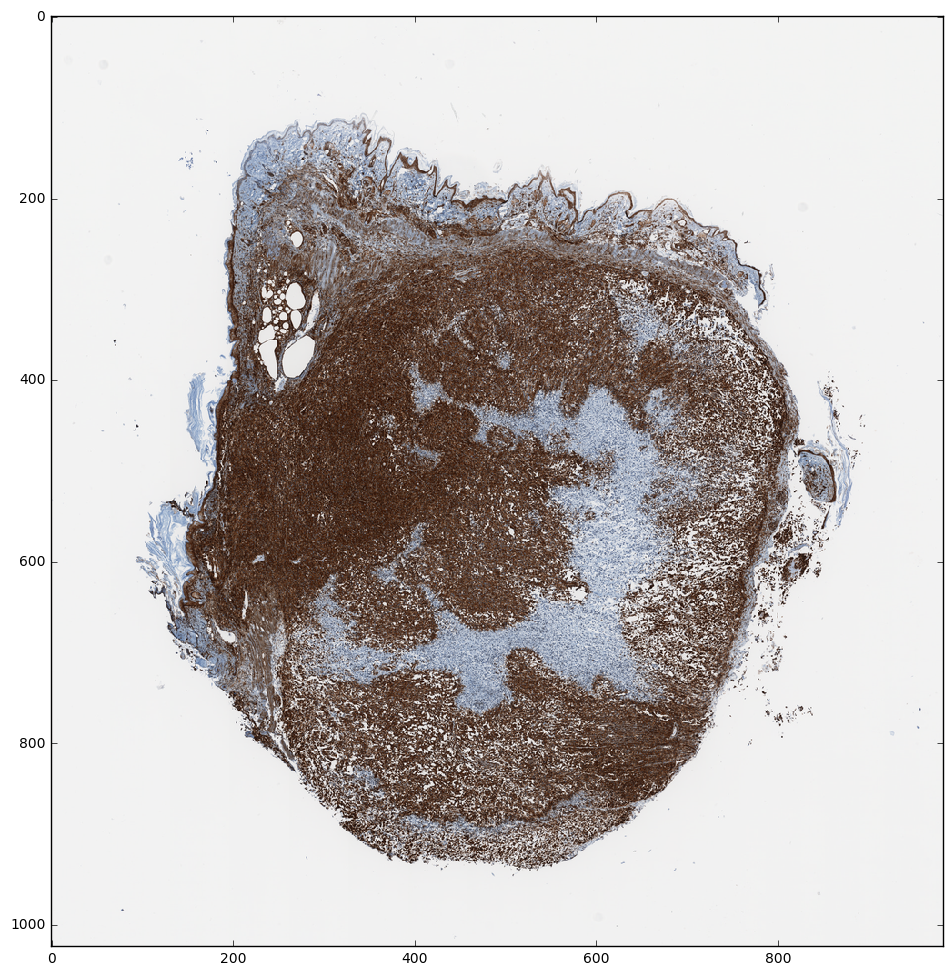

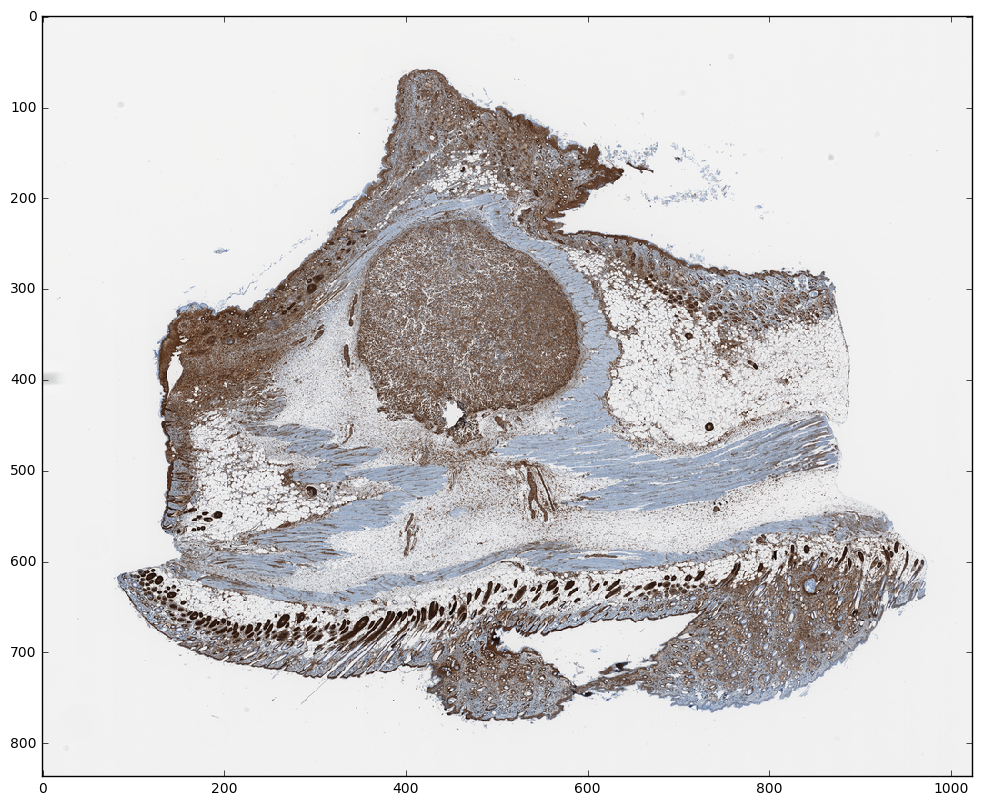

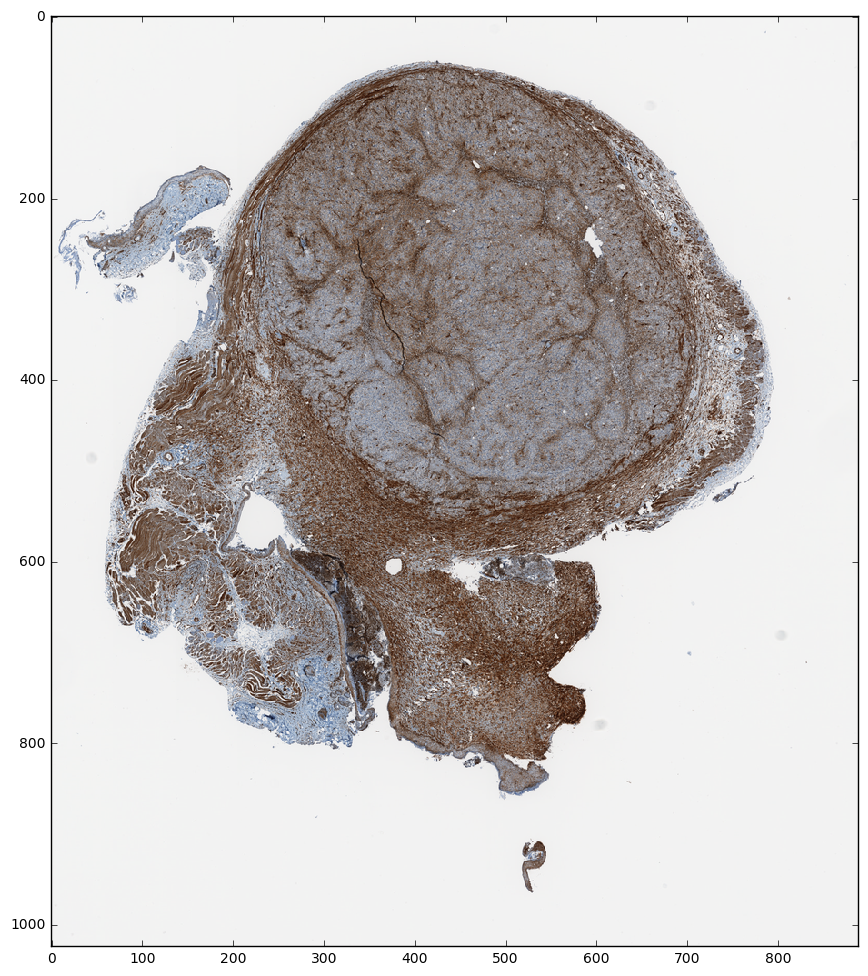

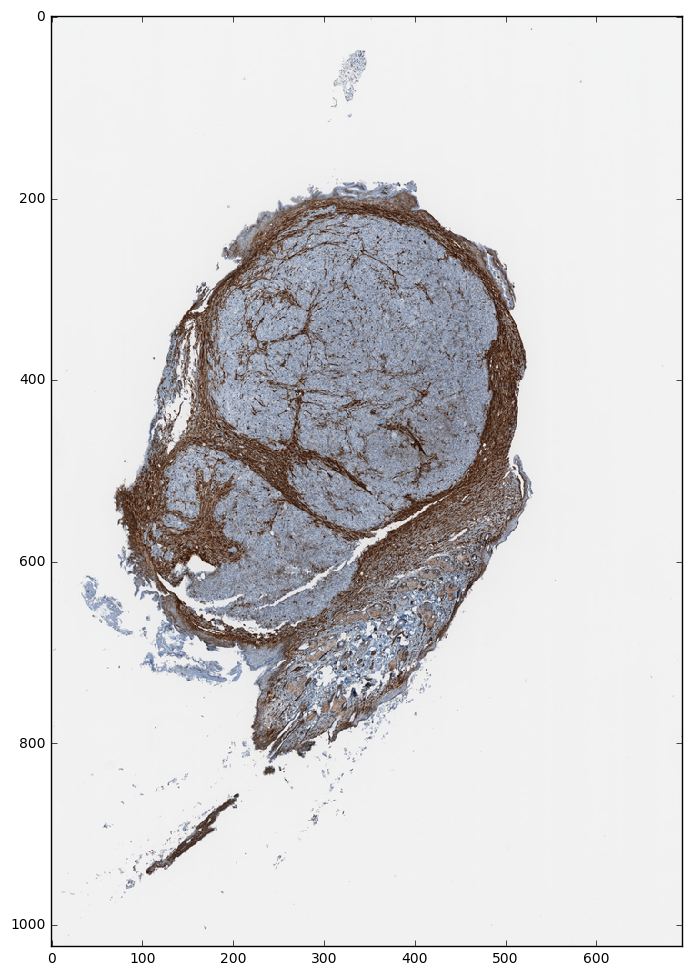

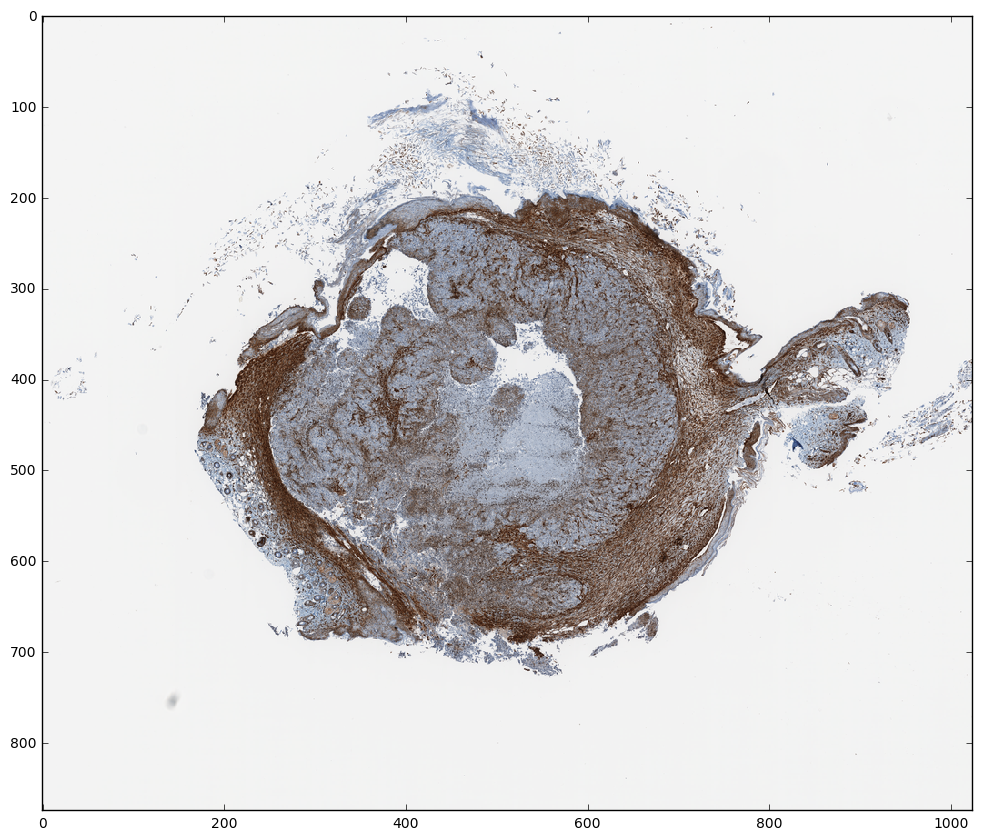

In [4]:
for slide in slides:
    width = int(slide.properties['openslide.level[0].width'])
    height = int(slide.properties['openslide.level[0].height'])
    img = slide.get_thumbnail((1024,1024))
    print width,'x',height,':',width*height/1000000.
    show(img)

## Break the data down into tiles

In [27]:
# Set tiling parameters
tile_size = (64,64) # (width, height)
level = 0 # highest res layer

# pick an image
slide_num = 2
slide = slides[slide_num]
dimensions = slide.dimensions # (width, height)

print 'creating', (dimensions[0]/tile_size[0]) * (dimensions[1]/tile_size[1]), 'tiles for slide', slide_num, '...'

i = 0
for x in xrange(0, dimensions[0], tile_size[0]):
    for y in xrange(0, dimensions[1], tile_size[1]):
        
        # create the tile (read_region takes location (upper left pixel), level, and size)
        tile = slide.read_region((x,y), level, tile_size)
        
        # create the filename and save the tile
        filename = 'data/tiles/slide_' + slide_names[slide_num] + '_' + '{:06d}'.format(i) + '.tiff'
        
        
        # don't save blank tiles
        if not is_empty(tile):
            tile.save(filename, "TIFF")

        # update the tile num
        i+=1

print 'done.'

creating 25245 tiles for slide 2 ...


## Read a tile back in

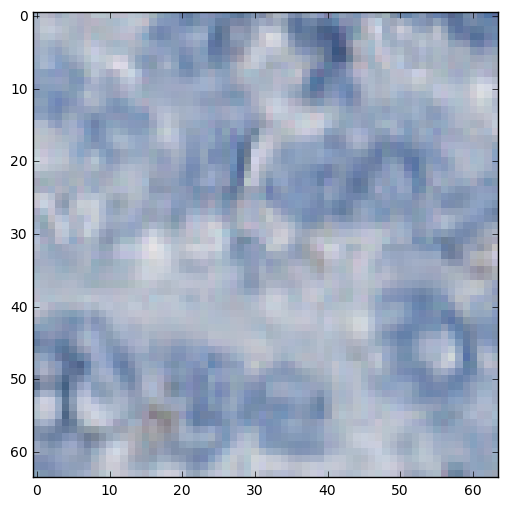

In [30]:
from PIL import Image
img = Image.open("data/tiles/slide_70231_007612.tiff")
show(img)

In [36]:
from os import listdir
from os.path import isfile, join

# Get all of the tile files
path = "data/tiles/"
files = [f for f in listdir(path) if isfile(join(path, f))]